# The stability of the global average on different window lengths
This notebook outllines different methods that can be used to de-trend the LongRunMIP and ZECMIP time series.

# Imports

In [3]:
import nc_time_axis
import warnings
import json
import xarray as xr
import numpy as np
import pandas as pd
from importlib import reload
from numba import njit
from scipy.stats import spearmanr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import matplotlib.gridspec as gridspec 
from matplotlib.axes import Axes
import matplotlib as mpl
import time
import pymannkendall
import os
import sys
import string

from numpy.typing import ArrayLike
from typing import Optional, Callable, List, Tuple, Dict

warnings.filterwarnings('ignore')

In [4]:
sys.path.append(os.path.join(os.getcwd(), 'Documents/PhD'))

In [5]:
import constants
from constants import PlotConfig
sys.path.append(constants.MODULE_DIR)
import sn_plotting
import xarray_class_accessors as xca
import utils
import stats
import xarray_extender as xce
import signal_to_noise as sn
import open_ds
from classes import ExperimentTypes, LocationsLatLon
import plotting_functions
import xarray_extender as xe

logger = utils.get_notebook_logger()

In [6]:
notebook_number='01'

In [7]:
%matplotlib inline

In [8]:
from dask.distributed import Client
client = Client()
client

- State start
-   Scheduler at:     tcp://127.0.0.1:33705
-   dashboard at:        /proxy/44041/status
-         Start Nanny at: 'tcp://127.0.0.1:40241'
-         Start Nanny at: 'tcp://127.0.0.1:43099'
-         Start Nanny at: 'tcp://127.0.0.1:45683'
-         Start Nanny at: 'tcp://127.0.0.1:43129'
-         Start Nanny at: 'tcp://127.0.0.1:43485'
-         Start Nanny at: 'tcp://127.0.0.1:45155'
-         Start Nanny at: 'tcp://127.0.0.1:41663'
- Register worker <WorkerState 'tcp://127.0.0.1:39895', name: 5, status: init, memory: 0, processing: 0>
- Starting worker compute stream, tcp://127.0.0.1:39895
- Starting established connection to tcp://127.0.0.1:51138
- Register worker <WorkerState 'tcp://127.0.0.1:35629', name: 3, status: init, memory: 0, processing: 0>
- Starting worker compute stream, tcp://127.0.0.1:35629
- Starting established connection to tcp://127.0.0.1:51122
- Register worker <WorkerState 'tcp://127.0.0.1:41887', name: 1, status: init, memory: 0, processing: 0>
- 

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/44041/status,
Dashboard: /proxy/44041/status,Workers: 7
Total threads: 14,Total memory: 63.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:33705,Workers: 7
Dashboard: /proxy/44041/status,Total threads: 14
Started: Just now,Total memory: 63.00 GiB
Comm: tcp://127.0.0.1:33983,Total threads: 2
Dashboard: /proxy/42691/status,Memory: 9.00 GiB
Nanny: tcp://127.0.0.1:40241,


In [7]:
# client.close()

In [8]:
# from dask_jobqueue import PBSCluster
# # One node on Gadi has 48 cores - try and use up a full core before going to multiple nodes (jobs)

# walltime = '00:10:00'
# cores = 48
# memory = str(cores * 4) + 'GB'

# cluster = PBSCluster(walltime=str(walltime), cores=cores, memory=str(memory), processes=cores,
#                      job_extra_directives=['-q normal',
#                                            '-P w42',
#                                            '-l ncpus='+str(cores),
#                                            '-l mem='+str(memory),
#                                            '-l storage=gdata/w42+gdata/rt52'],
#                      local_directory='$TMPDIR',
#                      job_directives_skip=["select"])
# cluster.scale(jobs=1)
# client = Client(cluster)

# Loading Data

In [9]:
with open(os.path.join(os.getcwd(), 'Documents', 'PhD', 'data','zecmip_onepercent_branch_point.json'),'r') as fp:
    zecmip_onepercent_branch_point = json.loads(fp.read())

In [10]:
zecmip_onepercent_branch_point

{'metadata': 'This is the year that the 1pct CO2 run branchs off to the ZECMIP experiment.',
 'branch_year': {'CanESM5': 61,
  'MIROC-ES2L': 63,
  'UKESM1-0-LL': 66,
  'MPI-ESM1-2-LR': 65,
  'GISS-E2-1-G-CC': 70,
  'CESM2': 67,
  'NorESM2-LM': 66,
  'GFDL-ESM4': 63,
  'ACCESS-ESM1-5': 67}}

In [10]:
experiment_params = constants.EXPERIMENTS_TO_RUN[0]
experiment_params

{'variable': 'tas', 'mask': None, 'hemisphere': 'global'}

In [11]:
constants.ZECMIP_LOCAL_REGRIDDED_DIR,

('/g/data/w40/ab2313/PhD/zecmip/regridded',)

In [12]:
reload(xca)

<module 'xarray_class_accessors' from '/home/563/ab2313/Documents/PhD/modules/xarray_class_accessors.py'>

In [13]:
experiment_zec_da = open_ds.open_mfdataset_nc(os.path.join(constants.ZECMIP_LOCAL_REGRIDDED_DIR, 'A1'), 
                                              to_array=False).tas
picontrol_zec_da = open_ds.open_mfdataset_nc(os.path.join(constants.ZECMIP_LOCAL_REGRIDDED_DIR, 'picontrol'),
                                             to_array=False).tas

In [14]:
picontrol_zec_da

<xarray.DataArray 'tas' (time: 165, model: 9, lat: 96, lon: 192)>
dask.array<getitem, shape=(165, 9, 96, 192), dtype=float32, chunksize=(165, 1, 96, 192), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -88.57 -86.72 -84.86 -83.0 ... 83.0 84.86 86.72 88.57
  * lon      (lon) float64 0.0 1.875 3.75 5.625 7.5 ... 352.5 354.4 356.2 358.1
  * time     (time) object 0001-12-31 00:00:00 ... 0165-12-31 00:00:00
  * model    (model) object 'ACCESS-ESM1-5' 'CESM2' ... 'UKESM1-0-LL'
    height   float64 2.0

In [15]:
onepct_zec_da = open_ds.open_mfdataset_nc(os.path.join(constants.ZECMIP_LOCAL_REGRIDDED_DIR, '1pct'),
                                             to_array=False).tas

# TODO: This code is not very safe. 
model_values = onepct_zec_da.model.values
model_values[np.where(model_values == 'GISS-E2-1-G')[0][0]] = 'GISS-E2-1-G-CC'

onepct_zec_da['models'] = xr.DataArray(model_values, dims='model')
onepct_zec_da

<xarray.DataArray 'tas' (time: 150, model: 9, lat: 96, lon: 192)>
dask.array<getitem, shape=(150, 9, 96, 192), dtype=float32, chunksize=(150, 1, 96, 192), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -88.57 -86.72 -84.86 -83.0 ... 83.0 84.86 86.72 88.57
  * lon      (lon) float64 0.0 1.875 3.75 5.625 7.5 ... 352.5 354.4 356.2 358.1
  * time     (time) object 0001-12-31 00:00:00 ... 0150-12-31 00:00:00
  * model    (model) object 'ACCESS-ESM1-5' 'CESM2' ... 'UKESM1-0-LL'
    height   float64 2.0
    models   (model) object 'ACCESS-ESM1-5' 'CESM2' ... 'UKESM1-0-LL'

In [16]:
# Converting to degC
picontrol_zec_da = picontrol_zec_da - 273.15

In [17]:
# Calculating the global average
experiment_zec_ds_smean = sn.calculate_global_value(experiment_zec_da, experiment_params["variable"]).chunk('auto')
picontrol_zec_ds_smean = sn.calculate_global_value(picontrol_zec_da, experiment_params["variable"]).chunk('auto')
onepct_zec_da_smean = sn.calculate_global_value(onepct_zec_da, experiment_params["variable"])#.chunk('auto')

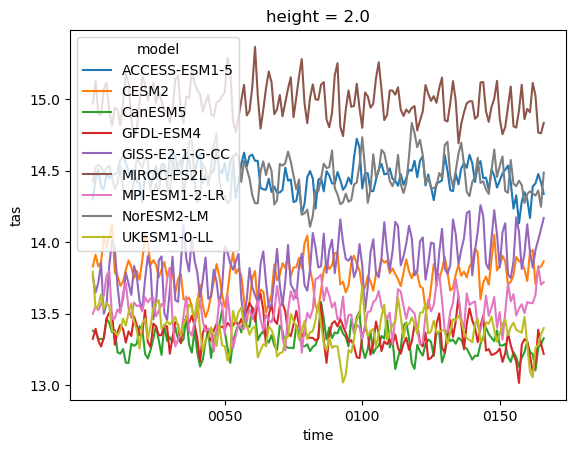

In [18]:
picontrol_zec_ds_smean.plot(hue='model')

In [19]:
to_concat = []
for model in onepct_zec_da_smean.model.values:
    single_model_ds = onepct_zec_da_smean.sel(model=model)
    start_branch_year = int(zecmip_onepercent_branch_point['branch_year'][model])
    branch_mean_ds = single_model_ds.isel(time=slice(start_branch_year-10, start_branch_year+10)).mean(dim='time')
    to_concat.append(branch_mean_ds)
branch_point_mean_ds_smean = xr.concat(to_concat, pd.Index(onepct_zec_da.model.values, name='model'))

In [20]:
experiment_zec_ds_smean_anom = experiment_zec_ds_smean - branch_point_mean_ds_smean

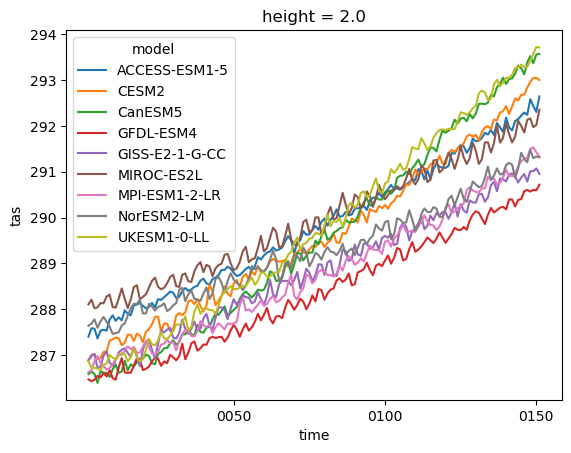

In [21]:
onepct_zec_da_smean.plot(x='time', hue='model')

In [22]:
experiment_zec_ds_smean_anom

<xarray.DataArray 'tas' (time: 100, model: 9)>
dask.array<sub, shape=(100, 9), dtype=float64, chunksize=(100, 1), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) object 0001-12-31 00:00:00 ... 0100-12-31 00:00:00
  * model    (model) object 'ACCESS-ESM1-5' 'CESM2' ... 'UKESM1-0-LL'
    height   float64 2.0
    models   (model) object 'ACCESS-ESM1-5' 'CESM2' ... 'UKESM1-0-LL'

# Global

## Calculations

In [23]:
trend_da = stats.trend_fit(experiment_zec_ds_smean_anom, method='polynomial', order=3)
detrended_da = experiment_zec_ds_smean_anom - trend_da

In [24]:
constants.ZECMIP_MULTI_WINDOW_RUN_PARAMS

{'start_window': 10, 'end_window': 41, 'step_window': 1}

In [25]:
ZECMIP_MULTI_WINDOW_RUN_PARAMS = {'start_window': 10, 'end_window': 41, 'step_window': 1}

In [27]:
sn_multi_static_ds = sn.multiwindow_signal_to_nosie_and_bounds(
    experiment_zec_ds_smean_anom, picontrol_zec_ds_smean,
    rolling_noise=False, da_for_noise = detrended_da,
    logginglevel='ERROR', return_all=True,
    **ZECMIP_MULTI_WINDOW_RUN_PARAMS)


Experiment
--------

Concatenating objects - PLEASE be patient!
 - Finished

Control
------


Concatenating objects - PLEASE be patient!
Persist
- Event loop was unresponsive in Nanny for 3.05s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
- Event loop was unresponsive in Nanny for 3.09s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
Calculating bounds
- Event loop was unresponsive in Nanny for 3.70s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
- Event loop was unresponsive in Nanny for 3.58s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
- Event loop was unresponsive in Scheduler for 3.48s.  This is often caused by long-running GIL-holding

In [28]:
sn_multi_rolling_ds = sn.multiwindow_signal_to_nosie_and_bounds(
    experiment_zec_ds_smean_anom, picontrol_zec_ds_smean,
    rolling_noise=True, da_for_noise = detrended_da,
    logginglevel='ERROR', return_all=True,
    **ZECMIP_MULTI_WINDOW_RUN_PARAMS)


Experiment
--------
10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 
Concatenating objects - PLEASE be patient!
 - Finished

Control
------

10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 
Concatenating objects - PLEASE be patient!
Persist
Calculating bounds
- Event loop was unresponsive in Nanny for 10.22s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
- Event loop was unresponsive in Nanny for 10.14s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
- Event loop was unresponsive in Nanny for 10.07s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
- Event loop was unresponsive in Na

In [30]:
max_effective_length = 50

In [31]:
# Number of models stable at each time step.
rolling_stability_levels_ds = sn.stability_levels(sn_multi_rolling_ds)#.chunk('auto')
static_stability_levels_ds = sn.stability_levels(sn_multi_static_ds)#.chunk('auto')

# Year when models first become stable.
rolling_year_stable = sn.get_stable_year_ds(sn_multi_rolling_ds, max_effective_length=max_effective_length)#.chunk('auto')
static_year_stable = sn.get_stable_year_ds(sn_multi_static_ds, max_effective_length=max_effective_length)#.chunk('auto')

In [32]:
unstable_rolling = sn_multi_rolling_ds.utils.above_or_below(
                                'signal_to_noise', greater_than_var='upper_bound', less_than_var='lower_bound')#.chunk('auto')
unstable_rolling

<xarray.Dataset>
Dimensions:          (time: 100, model: 9, window: 31)
Coordinates:
  * time             (time) object 0001-12-31 00:00:00 ... 0100-12-31 00:00:00
  * model            (model) object 'ACCESS-ESM1-5' 'CESM2' ... 'UKESM1-0-LL'
  * window           (window) int64 10 11 12 13 14 15 16 ... 35 36 37 38 39 40
    height           float64 2.0
    models           (model) object 'ACCESS-ESM1-5' 'CESM2' ... 'UKESM1-0-LL'
Data variables:
    signal_to_noise  (window, time, model) float64 dask.array<chunksize=(1, 100, 1), meta=np.ndarray>

In [33]:
stable_anom_da = sn.get_stabel_average_anomaly_over_windows(experiment_zec_ds_smean_anom,
                                               rolling_year_stable.squeeze().time, local=False);stable_anom_da

<function get_stable_average_anomaly_global at 0x15356fd96f70>


<xarray.DataArray 'temp' (window: 31, model: 9)>
dask.array<add, shape=(31, 9), dtype=float64, chunksize=(1, 1), chunktype=numpy.ndarray>
Coordinates:
  * model     (model) object 'ACCESS-ESM1-5' 'CESM2' ... 'UKESM1-0-LL'
  * window    (window) int64 10 11 12 13 14 15 16 17 ... 33 34 35 36 37 38 39 40
    height    float64 2.0
    models    (model) object 'ACCESS-ESM1-5' 'CESM2' ... 'UKESM1-0-LL'
    variable  <U15 'signal_to_noise'

# Plotting

In [34]:
units = constants.VARIABLE_INFO[experiment_params["variable"]]["units"]
longname = constants.VARIABLE_INFO[experiment_params["variable"]]['longname']
hemisphere_title = string.capwords(experiment_params['hemisphere'].replace('_', ' '))
mask_title = f'({experiment_params["mask"]} only)' if experiment_params["mask"] else ''

In [35]:
model = 2

In [36]:
experiment_zec_ds_smean_anom.model.values#[model]

array(['ACCESS-ESM1-5', 'CESM2', 'CanESM5', 'GFDL-ESM4', 'GISS-E2-1-G-CC',
       'MIROC-ES2L', 'MPI-ESM1-2-LR', 'NorESM2-LM', 'UKESM1-0-LL'],
      dtype=object)

In [37]:
# Manual Calculation for Demonstations
WINDOW=25
# Sample period is the years that we want to look at
sample_period = (0,WINDOW) #(1200,1261), 61

# The length of the sample_period varible
window_length = WINDOW

# Subset
sample_data = experiment_zec_ds_smean_anom.isel(time=slice(*sample_period), model=model)
sample_values = sample_data.values
x = np.arange(len(sample_values))

# Gradient and y-intercept of the sample data (use=[0,1] will return grad and y intercept)
p = np.polyfit(x=x, y=sample_values, deg=1)
fitted_line = np.polyval(p, x=x)

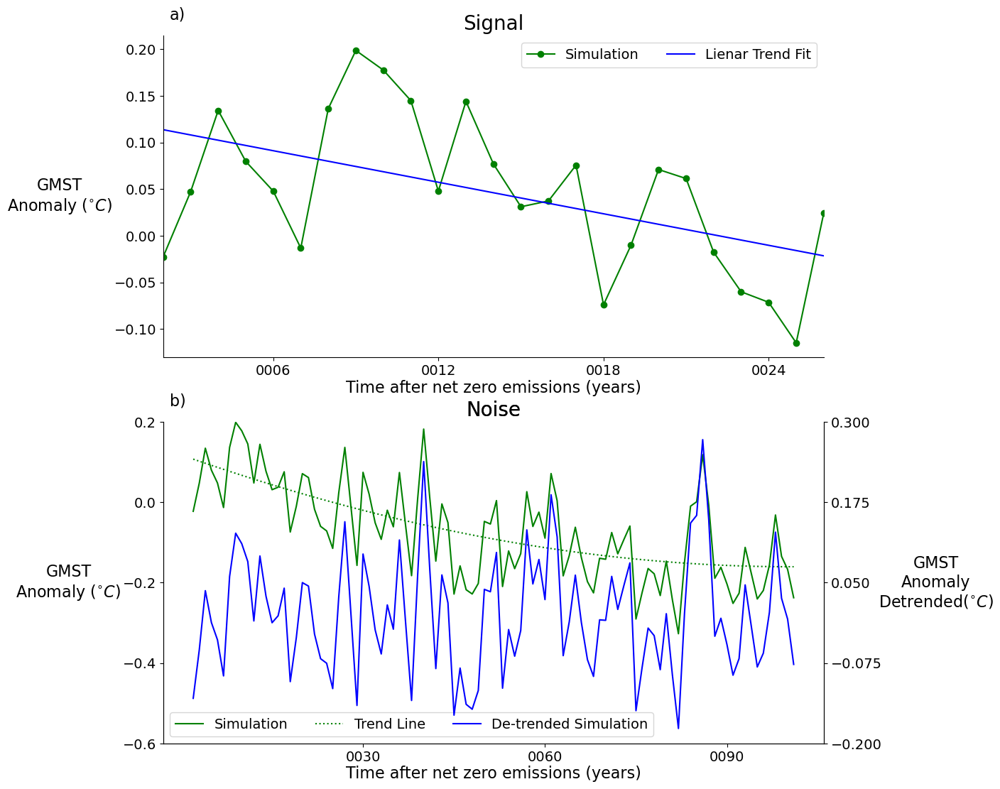

In [38]:
plt.style.use('default')
fig = plt.figure(figsize=(12,20))
axes = [fig.add_subplot(3,1,i) for i in range(1,3)]


# ---> axes[0]
sample_data.plot(ax=axes[0], marker='o', label='Simulation', color='green')
axes[0].plot(sample_data.time.values, fitted_line, label='Lienar Trend Fit', color='blue')
axes[0].set_xlim(sample_data.time.values[0], sample_data.time.values[-1])
axes[0].legend(ncol=2, fontsize=constants.PlotConfig.legend_text_size)

plotting_functions.format_axis(axes[0], title='Signal', xlabel='Time after net zero emissions (years)', ylabel='GMST\n'+r'Anomaly ($^{\circ}C$)',
                               labelpad=55, invisible_spines=['top', 'right'])
plotting_functions.add_figure_label(axes[0], 'a)')

# ---> axes[1]
ax1 = axes[1]; ax2 = axes[1].twinx()
lns1 = experiment_zec_ds_smean_anom.isel(model=model).plot(ax=ax1, color='green', label='Simulation')
lns2 = trend_da.isel(model=model).plot(ax=ax1, label='Trend Line', color='green', linestyle=':')
lns3 = detrended_da.isel(model=model).plot(ax=ax2, label='De-trended Simulation', color='blue')

ytick_locactions = np.arange(-.6, 0.4, 0.2)
ax1.set_yticks(ytick_locactions)
ax1.set_ylim(ytick_locactions[0], ytick_locactions[-1])
ax2_ytick_locations=np.linspace(ax2.get_yticks()[0], ax2.get_yticks()[-1], len(ax1.get_yticks()))
ax2.set_yticks(ax2_ytick_locations)

lns = lns1+lns2+lns3
labs = [l.get_label() for l in lns]
ax1.legend(lns, labs, ncol=3, loc='best', fontsize=constants.PlotConfig.legend_text_size)

plotting_functions.format_axis(ax1, title='Noise', xlabel='Time after net zero emissions (years)', ylabel='GMST\n'+r'Anomaly ($^{\circ}C$)',
                               labelpad=55, invisible_spines=['top'])
plotting_functions.format_axis(ax2, title='Noise', ylabel='GMST\nAnomaly\nDetrended' + r'($^{\circ}C$)',
                               labelpad=55, invisible_spines=['top'])
plotting_functions.add_figure_label(ax1, 'b)')

fig.savefig(os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL, f'{notebook_number}_method_demonstration.png'),
            bbox_inches='tight', dpi=300)

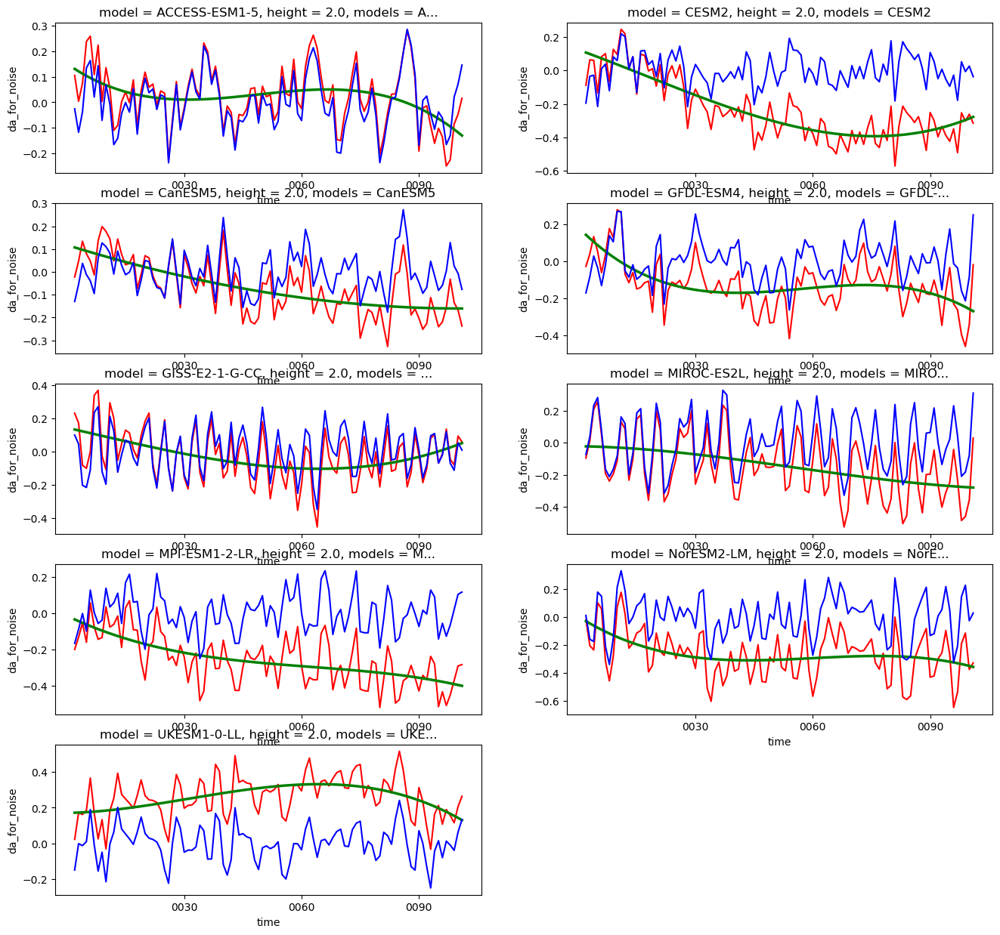

In [39]:
models = experiment_zec_ds_smean.model.values
ncols = 2
nrows = int(np.ceil(len(models)/ncols))

fig = plt.figure(figsize=(8*ncols, 3*nrows))
for plot_num, model in enumerate(models):
    ax = fig.add_subplot(nrows,ncols,plot_num+1)
    experiment_zec_ds_smean_anom.sel(model=model).plot(ax=ax, color='red')
    trend_da.sel(model=model).plot(ax=ax, linewidth=2.5, color='green')
    detrended_da.sel(model=model).plot(ax=ax, color='blue')

In [40]:
fig, ax = sn_plotting.plot_median_stable_year(static_year_stable, rolling_year_stable)

fig.savefig(os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL, f'{notebook_number}_stabilisation_year_double_poly_vs_static.png'), dpi=300, bbox_inches='tight')

AttributeError: module 'sn_plotting' has no attribute 'plot_median_stable_year'

In [41]:
reload(constants)
reload(sn_plotting)

<module 'sn_plotting' from '/home/563/ab2313/Documents/PhD/modules/sn_plotting.py'>

- full garbage collection released 135.41 MiB from 4241 reference cycles (threshold: 9.54 MiB)
/g/data/w40/ab2313/images/PhD/top_level/01_global_average_year_of_stabilisation_diff.png


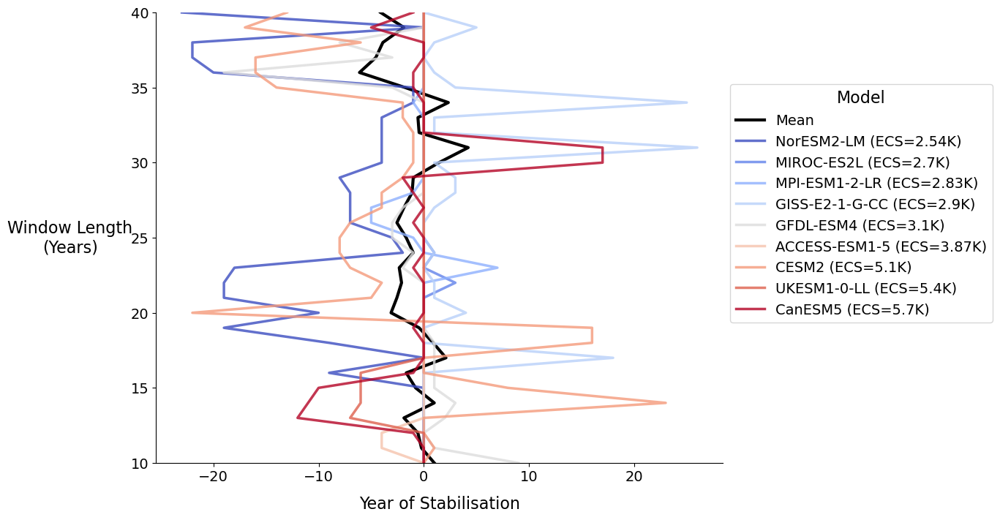

In [42]:
fig, ax = sn_plotting.plot_stable_year_all_models(static_year_stable-rolling_year_stable, exp_type='zecmip')
plt.style.use('default')
save_name = os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL,
                         f'{notebook_number}_global_average_year_of_stabilisation_diff.png')
print(save_name)
# fig.savefig(save_name, dpi=300, bbox_inches='tight')

In [43]:
reload(sn_plotting)
reload(constants)

<module 'constants' from '/home/563/ab2313/Documents/PhD/constants.py'>

/g/data/w40/ab2313/images/PhD/top_level/01_global_average_year_of_stabilisation_static.png


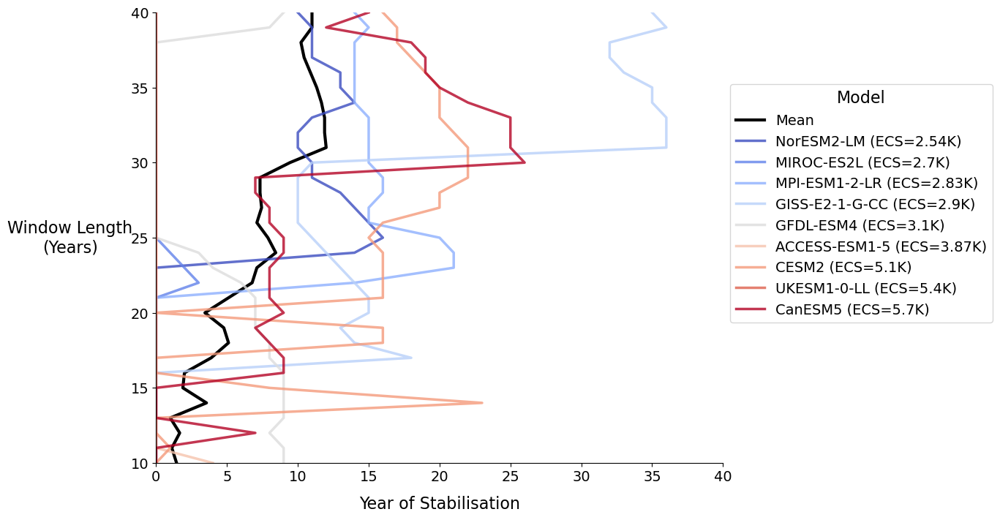

In [44]:
fig, ax = sn_plotting.plot_stable_year_all_models(static_year_stable, xlim=(0, 40), exp_type='zecmip')
save_name = os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL,
                         f'{notebook_number}_global_average_year_of_stabilisation_static.png')
print(save_name)
fig.savefig(save_name, dpi=300, bbox_inches='tight')

/g/data/w40/ab2313/images/PhD/top_level/01_global_average_year_of_stabilisation_rolling.png


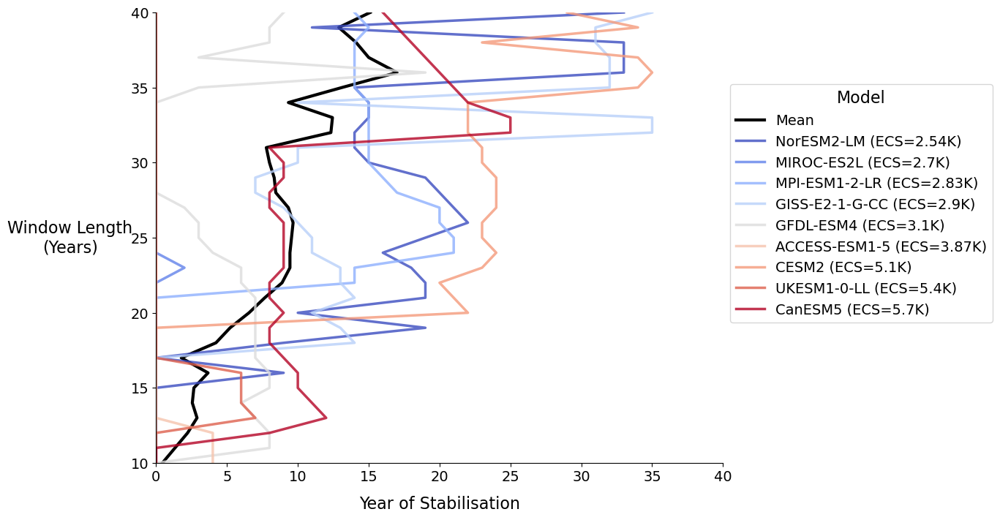

In [45]:
reload(sn_plotting)
fig, ax = sn_plotting.plot_stable_year_all_models(rolling_year_stable, xlim=(0, 40), exp_type='zecmip')
save_name = os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL, f'{notebook_number}_global_average_year_of_stabilisation_rolling.png')
print(save_name)
fig.savefig(save_name, dpi=300, bbox_inches='tight')

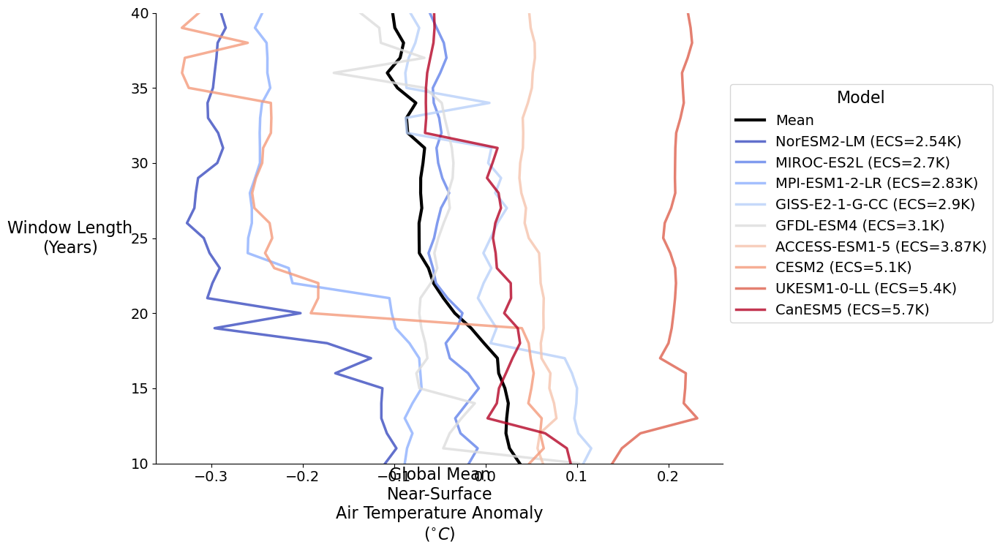

In [46]:
fig, ax = sn_plotting.plot_stable_year_all_models(stable_anom_da.to_dataset(name='time'), exp_type='zecmip', 
                                                 xlabel=f'Global Mean\n{longname} Anomaly\n({units})')

In [47]:
reload(sn_plotting)
reload(plotting_functions)

<module 'plotting_functions' from '/home/563/ab2313/Documents/PhD/modules/plotting_functions.py'>

- full garbage collection released 66.73 MiB from 11596 reference cycles (threshold: 9.54 MiB)
/g/data/w40/ab2313/images/PhD/top_level/01_global_average_year_of_stabilisation_and_temp_anomaly.png


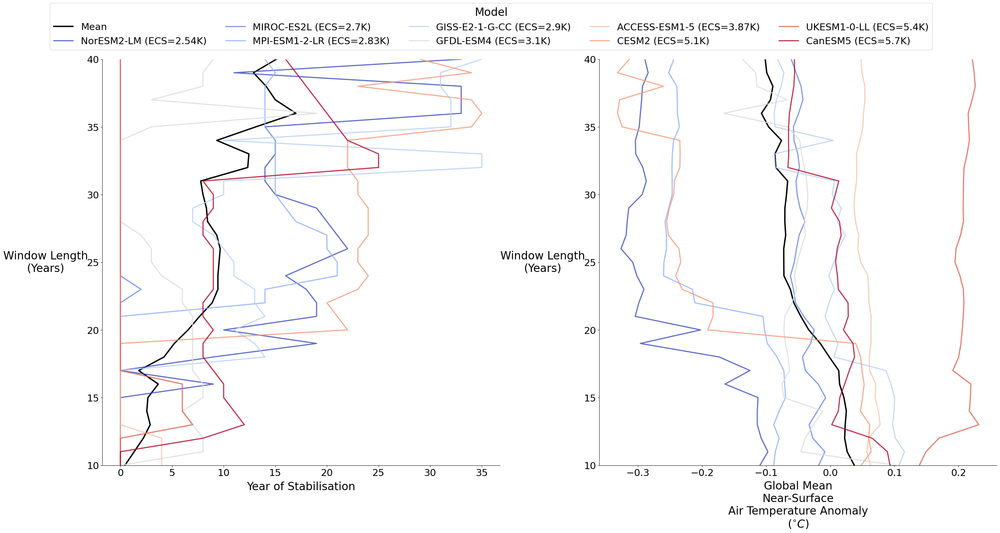

In [48]:
fig = plt.figure(figsize=(35, 16))
gs = gridspec.GridSpec(1,2, wspace=0.25)
ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1])
reload(sn_plotting)
fig, ax = sn_plotting.plot_stable_year_all_models(rolling_year_stable, exp_type='zecmip', ncol=5, 
                                                 fig=fig, ax=ax1, legend_loc = 'top_ofset',
                                                 bbox_to_anchor=(2.1, 1.15), font_scale=1.5)

fig, ax =sn_plotting.plot_stable_year_all_models(
    stable_anom_da.to_dataset(name='time'), fig=fig, ax=ax2, exp_type='zecmip', 
    xlabel=f'Global Mean\n{longname} Anomaly\n({units})',
    add_legend=False, font_scale=1.5, xlabelpad=60)

save_name = os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL,
                         f'{notebook_number}_global_average_year_of_stabilisation_and_temp_anomaly.png')
print(save_name)
fig.savefig(save_name, dpi=300, bbox_inches='tight')

In [49]:
reload(sn_plotting)

<module 'sn_plotting' from '/home/563/ab2313/Documents/PhD/modules/sn_plotting.py'>

In [50]:
plt.style.use('default')

/g/data/w40/ab2313/images/PhD/top_level/01_global_average_year_of_stabilisation_static_and_rolling.png


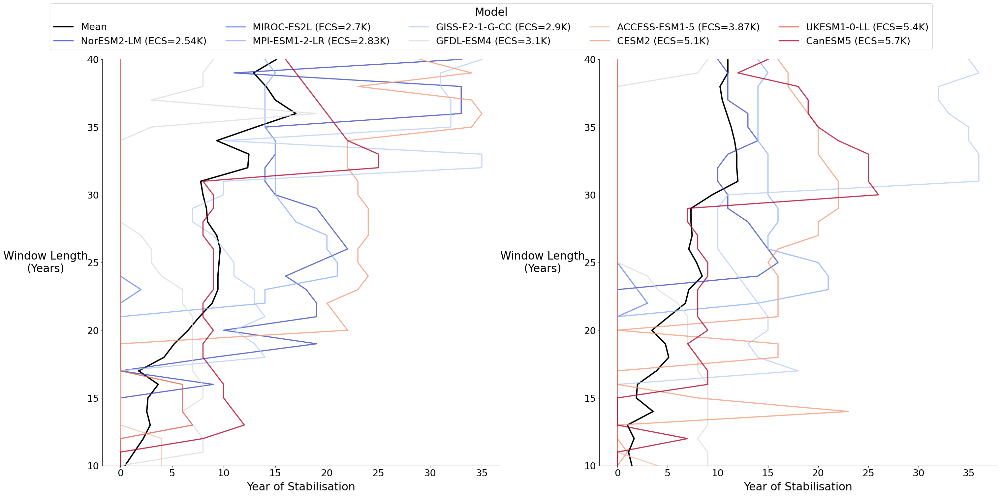

In [51]:
fig = plt.figure(figsize=(35, 16))
gs = gridspec.GridSpec(1,2, wspace=0.25)
ax1 = fig.add_subplot(gs[0]); ax2 = fig.add_subplot(gs[1])
fig, ax = sn_plotting.plot_stable_year_all_models(rolling_year_stable, exp_type='zecmip', ncol=5, 
                                                 fig=fig, ax=ax1, legend_loc = 'top_ofset',
                                                 bbox_to_anchor=(2.1, 1.15), font_scale=1.5)
fig, ax = sn_plotting.plot_stable_year_all_models(static_year_stable, exp_type='zecmip', 
                                                 fig=fig, ax=ax2, add_legend=False, font_scale=1.5)
save_name = os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL,
                         f'{notebook_number}_global_average_year_of_stabilisation_static_and_rolling.png')
print(save_name)
fig.savefig(save_name, dpi=300, bbox_inches='tight')

/g/data/w40/ab2313/images/PhD/top_level/01_global_average_picontrol_time_series.png


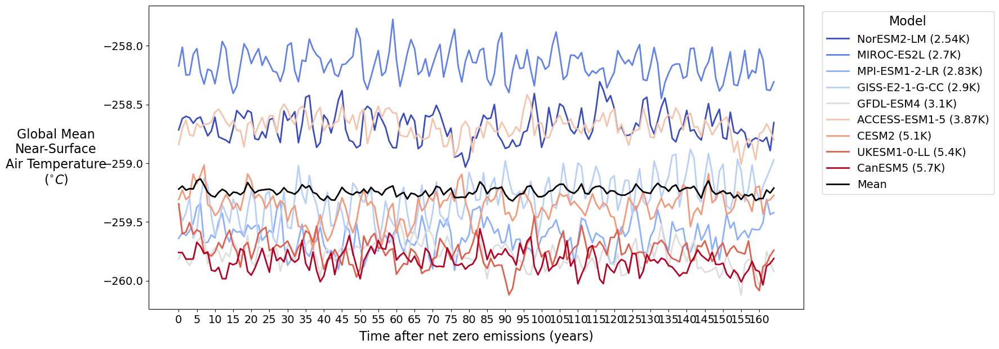

In [52]:
fig, ax = sn_plotting.plot_all_coord_lines(picontrol_zec_ds_smean-273.14, exp_type='zecmip', xlabel='Time after net zero emissions (years)',
                              ylabel=f'Global Mean\n{longname}\n({units})', ncol=1)
save_name = os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL, 
                         f'{notebook_number}_global_average_picontrol_time_series.png'); print(save_name)
fig.savefig(save_name, dpi=300, bbox_inches='tight')

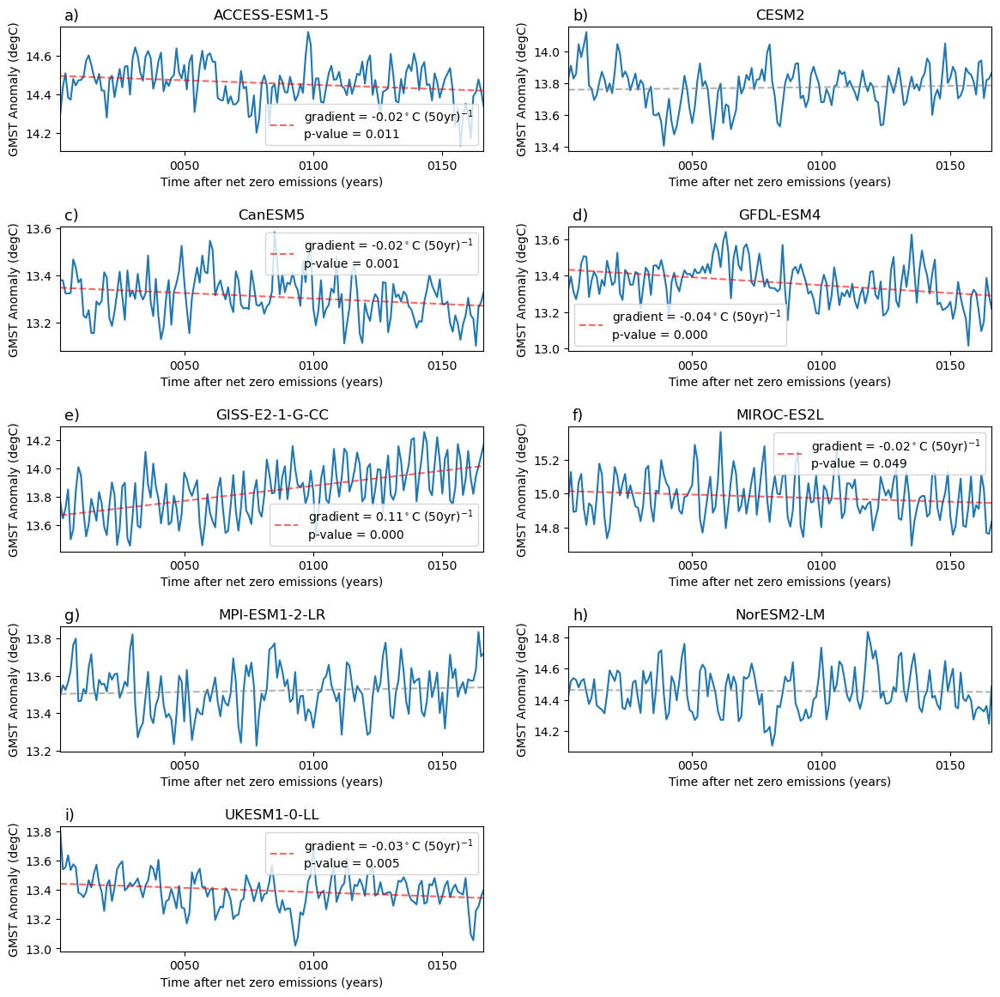

In [53]:
models = picontrol_zec_ds_smean.model.values
time = picontrol_zec_ds_smean.time.values
ncols = 2; nrows = int(np.ceil(len(models)/2))

fig = plt.figure(figsize=(14, 14))
gs = gridspec.GridSpec(nrows=nrows, ncols=ncols, hspace=0.6)

for num, model in enumerate(models):
    ax = fig.add_subplot(gs[num])
    plotting_functions.add_figure_label(ax, f'{chr(97+num)})', font_scale=0.8)
    picontrol_zec_ds_smean.sel(model=model).plot(ax=ax)
    ax.set_title(model); ax.set_ylabel('GMST Anomaly (degC)'); ax.set_xlabel('Time after net zero emissions (years)')
    ax.set_xlim([time[0], time[-1]])
    init_y = picontrol_zec_ds_smean.sel(model=model).values

    x = np.arange(len(init_y))

    grad_yint = np.polyfit(x, init_y, deg=1)

    fitted_line = np.polyval(grad_yint, x)
    mk_val = pymannkendall.original_test(init_y)
    mk_pval = mk_val.p
    if mk_pval < 0.05:
        color = 'red'
        label = f'gradient = {grad_yint[0]*50:.2f}' + r'$^\circ$C (50yr)$^{-1}$' + f'\np-value = {mk_pval:.3f}'
    else:
        color='grey'
        label=None
    
    ax.plot(time, fitted_line, linestyle='--', alpha=0.6, color=color, label=label)
    if mk_pval < 0.05:
        ax.legend(ncol=1, loc='best')#bbox_to_anchor=(0.6, 1.06))

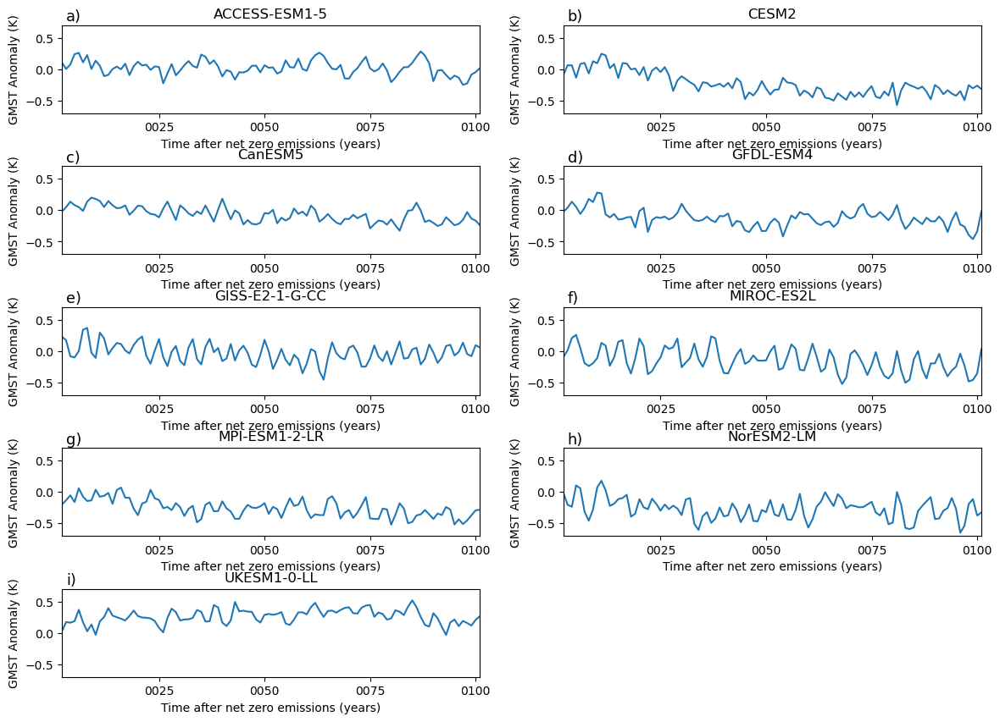

In [54]:
models = experiment_zec_ds_smean_anom.model.values
time = experiment_zec_ds_smean_anom.time.values
ncols = 2; nrows = int(np.ceil(len(models)/2))

fig = plt.figure(figsize=(14, 10))
gs = gridspec.GridSpec(nrows=nrows, ncols=ncols, hspace=0.6)

for num, model in enumerate(models):
    ax = fig.add_subplot(gs[num])
    plotting_functions.add_figure_label(ax, f'{chr(97+num)})', font_scale=0.8)
    experiment_zec_ds_smean_anom.sel(model=model).plot(ax=ax)
    ax.set_title(model); ax.set_ylabel('GMST Anomaly (K)'); ax.set_xlabel('Time after net zero emissions (years)')
    ax.set_xlim([time[0], time[-1]])
    ax.set_ylim(-.7, .7)

/g/data/w40/ab2313/images/PhD/top_level/01_global_average_A1_time_series.png


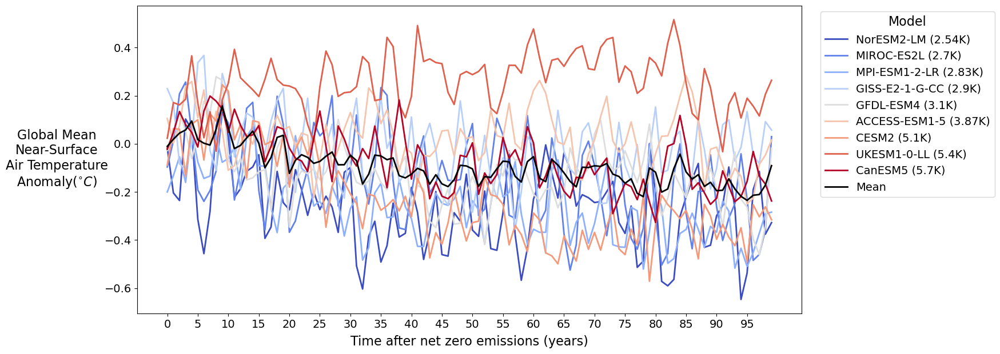

In [55]:
fig, ax = sn_plotting.plot_all_coord_lines(experiment_zec_ds_smean_anom, exp_type='zecmip',
                               xlabel='Time after net zero emissions (years)', ylabel=f'Global Mean\n{longname}\nAnomaly({units})', ncol=1)
save_name = os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL,
                         f'{notebook_number}_global_average_A1_time_series.png')
print(save_name)
fig.savefig(save_name, dpi=300, bbox_inches='tight')

In [56]:
models = rolling_year_stable.model.values
levels = np.arange(0, len(models)+1,1)
my_blues = plotting_functions.create_discrete_cmap('Blues', levels=levels, add_white=True)
my_reds = plotting_functions.create_discrete_cmap('Reds', levels=levels, add_white=True)

plot_kwargs = dict(exp_type='zecmip',vmin=0, vmax=len(models)+1, step=1, tick_offset='center',
                   extend='neither', cbar_label='Number of Unstable Models')

comparison_kwargs = dict(max_color_lim=50, xlims=(0,50), font_scale=1.6)

In [57]:
mpl.rcParams.update(mpl.rcParamsDefault)

fig = plt.figure(figsize=(sn_plotting.plot_kwargs['width'],
                          sn_plotting.plot_kwargs['height']*2.1))

gs = gridspec.GridSpec(3,1, height_ratios=[1, 1, 0.1], hspace=sn_plotting.plot_kwargs['hspace'])
axes = [fig.add_subplot(gs[i]) for i in range(3)]

sn_plotting.sn_multi_window_in_time(
    static_stability_levels_ds.sel(stability='unstable').count(dim='model'), cmap=my_blues,
    fig=fig, gs=gs, ax=axes[0], add_colorbar=False, return_all=False, axes_title='Static Noise',
    **plot_kwargs, **comparison_kwargs)

sn_plotting.sn_multi_window_in_time(
    rolling_stability_levels_ds.sel(stability='unstable').count(dim='model'), cmap=my_blues,
    fig=fig, gs=gs, ax=axes[1], cax=axes[2], return_all=False, axes_title='Rolling Noise',
    **plot_kwargs, **comparison_kwargs)

In [58]:
reload(sn_plotting)
reload(plotting_functions)
%matplotlib inline

In [59]:
stability_colorplot_kwargs = dict(max_color_lim=50, xlims=(0, 90),patch=True,
                                  ax2_ylabel=f'GMST Anomaly({units})')

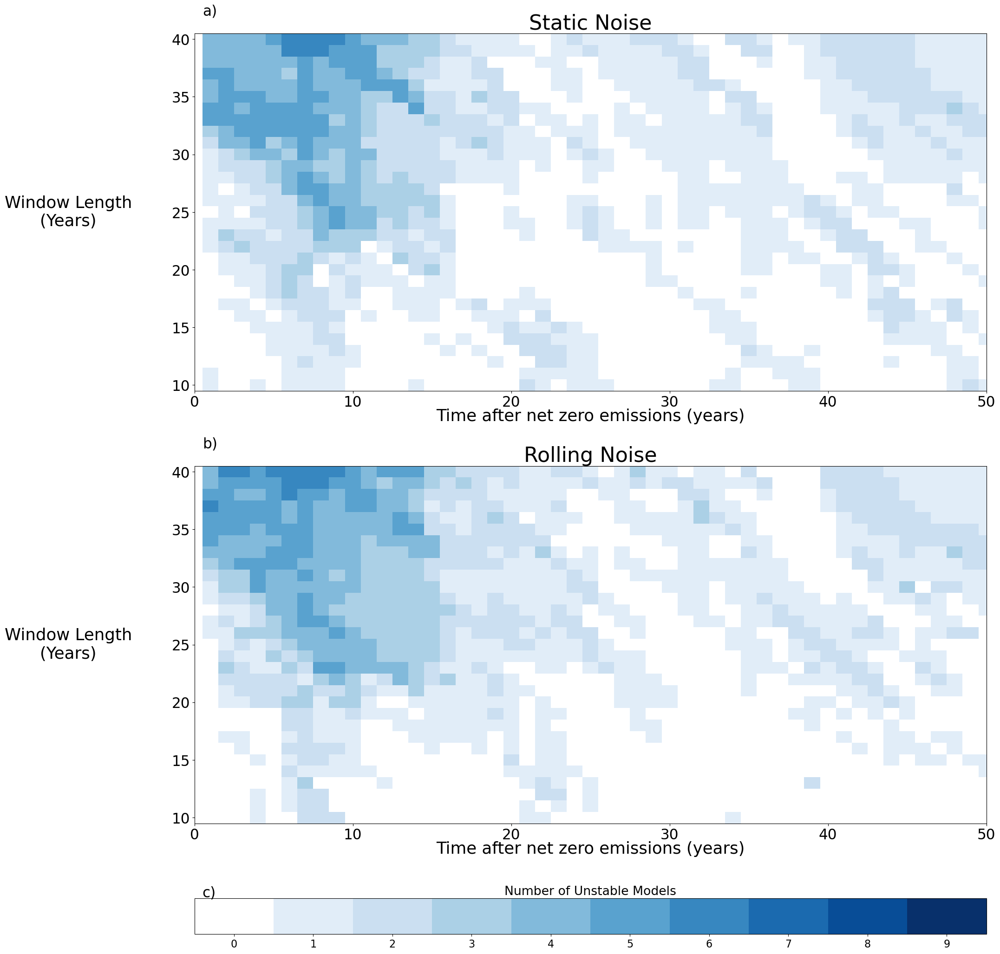

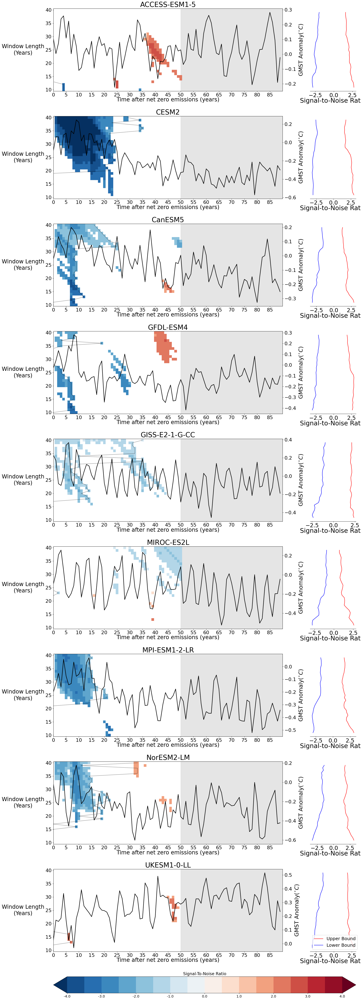

In [60]:
%matplotlib inline
models = unstable_rolling.model.values
sn_levels = np.arange(-4.5, 4.5+.5, 0.5)

fig = plt.figure(figsize=(sn_plotting.plot_kwargs['width'], 
                          sn_plotting.plot_kwargs['height']*len(models)/1.5))
gs = gridspec.GridSpec(len(models)+1, 2, height_ratios=len(models)*[1] + [0.2], width_ratios=[1, 0.2],
                       hspace=sn_plotting.plot_kwargs['hspace']*1.1)
axes_left = [fig.add_subplot(gs[i, 0]) for i in range(len(models))]
axes_right = [fig.add_subplot(gs[i, 1]) for i in range(len(models))]

for num, model in enumerate(models):
    add_colorbar=False; cax=None
    if num == len(models)-1: add_colorbar=True; cax=fig.add_subplot(gs[num+1, :])
    sn_plotting.sn_multi_window_in_time(
        unstable_rolling.sel(model=model).signal_to_noise, cmap='RdBu_r',
        fig=fig, gs=gs, ax=axes_left[num], cax=cax, add_colorbar=add_colorbar,
        axes_title=model, bbox_to_anchor=(1, 1.4),
        temp_da=experiment_zec_ds_smean_anom.sel(model=model),
        stable_point_ds = rolling_year_stable.sel(model=model), labelpad_left=65, labelpad_right=15,
        extend='both', cut_ticks=2, vmax=4, step=0.5,  font_scale=1.4, cbar_label='Signal-To-Noise Ratio',
        hspace=0.2, return_all=False, **stability_colorplot_kwargs, rotation=90)  
    
    sn_multi_rolling_ds.sel(model=model).upper_bound.plot(ax=axes_right[num], y='window', color='red',
                                                         label='Upper Bound')
    sn_multi_rolling_ds.sel(model=model).lower_bound.plot(ax=axes_right[num], y='window', color='blue',
                                                         label='Lower Bound')
    plotting_functions.format_axis(axes_right[num], xlabel='Signal-to-Noise Ratio', ylabel='',
                                  title='', font_scale=1.6)
    [axes_right[num].spines[sp].set_visible(False) for sp in ['top', 'left', 'right']]
    axes_right[num].set_yticks([])
    axes_right[num].set_yticklabels([])
    axes_right[num].set_title('')
    axes_right[num].set_ylabel('')
    if num == len(models)-1:axes_right[num].legend(ncol=1, fontsize=18)
    
for num, ax in enumerate(axes): plotting_functions.add_figure_label(ax, f'{chr(97+num)})', font_scale=1.4)

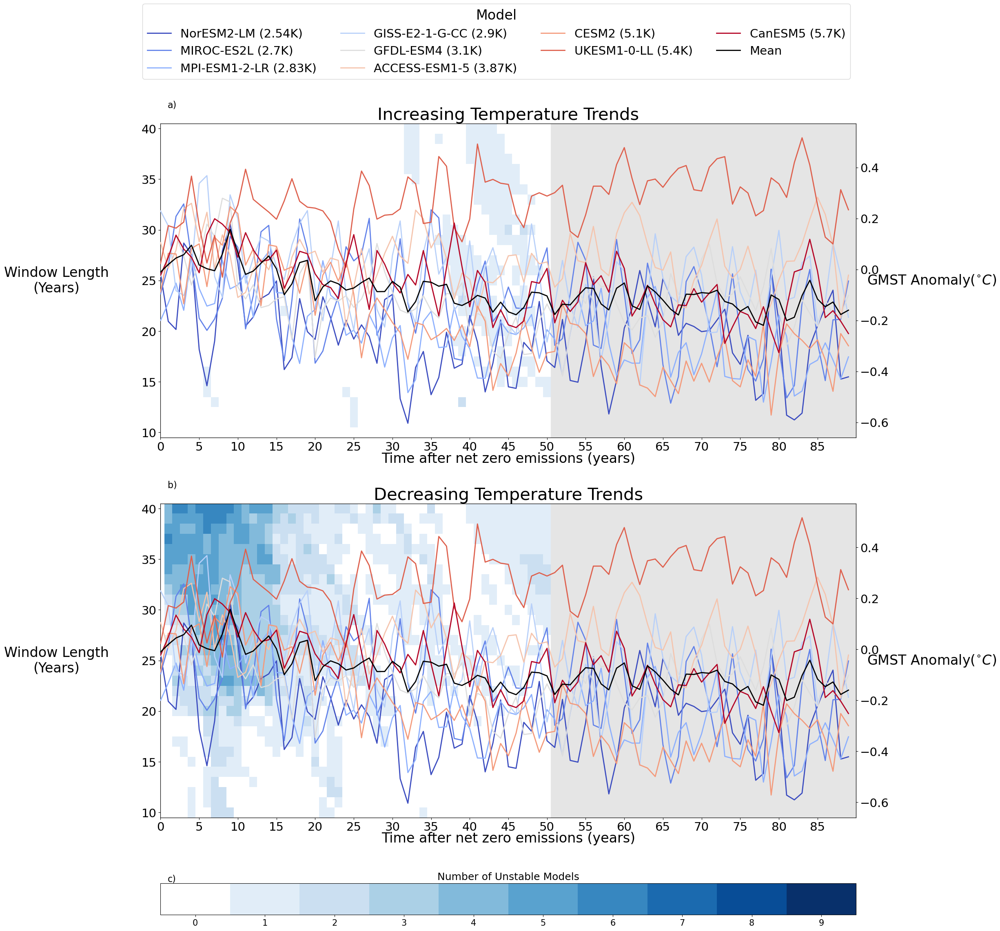

In [61]:
%matplotlib inline
fig = plt.figure(figsize=(sn_plotting.plot_kwargs['width'], sn_plotting.plot_kwargs['height']*2.1))

gs = gridspec.GridSpec(3,1, height_ratios=[1, 1, 0.1], hspace=sn_plotting.plot_kwargs['hspace'])
axes = [fig.add_subplot(gs[i]) for i in range(3)]

sn_plotting.sn_multi_window_in_time(
    rolling_stability_levels_ds.sel(stability='increasing').count(dim='model'), cmap=my_blues,
    fig=fig, gs=gs, ax=axes[0], add_colorbar=False, return_all=False,
    axes_title='Increasing Temperature Trends', bbox_to_anchor=(1, 1.4),
    temp_da=experiment_zec_ds_smean_anom,  **stability_colorplot_kwargs,  **plot_kwargs)

sn_plotting.sn_multi_window_in_time(
    rolling_stability_levels_ds.sel(stability='decreasing').count(dim='model'), cmap=my_blues,
    fig=fig, gs=gs, ax=axes[1], cax=axes[2], return_all=False,
    axes_title='Decreasing Temperature Trends',
    add_legend=False,
    temp_da=experiment_zec_ds_smean_anom, **stability_colorplot_kwargs,  **plot_kwargs)


for num, ax_ in enumerate(axes):
    plotting_functions.add_figure_label(ax_, f'{chr(97+num)})')

In [62]:
stability_colorplot_kwargs_no_temp_line = dict(max_color_lim=50, xlims=(0, 50),patch=False,
                                  ax2_ylabel=f'GMST Anomaly({units})', labelpad_left=70)

In [63]:
reload(sn_plotting)

<module 'sn_plotting' from '/home/563/ab2313/Documents/PhD/modules/sn_plotting.py'>

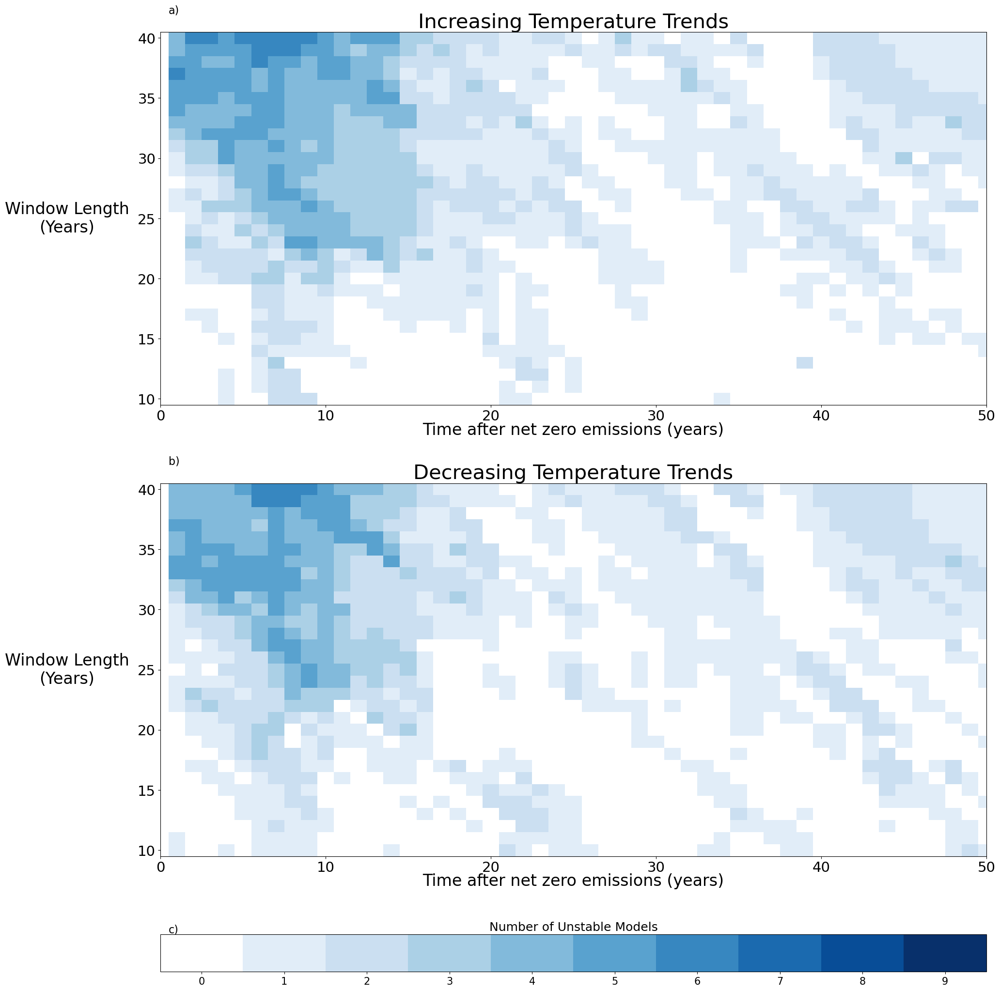

In [64]:
%matplotlib inline
fig = plt.figure(figsize=(sn_plotting.plot_kwargs['width'], sn_plotting.plot_kwargs['height']*2.1))

gs = gridspec.GridSpec(3,1, height_ratios=[1, 1, 0.1], hspace=sn_plotting.plot_kwargs['hspace'])
axes = [fig.add_subplot(gs[i]) for i in range(3)]

sn_plotting.sn_multi_window_in_time(
    rolling_stability_levels_ds.sel(stability='increasing').count(dim='model')+ rolling_stability_levels_ds.sel(stability='decreasing').count(dim='model'),
    cmap=my_blues,
    fig=fig, gs=gs, ax=axes[0], add_colorbar=False, return_all=False,
    axes_title='Increasing Temperature Trends', bbox_to_anchor=(1, 1.4),
    **stability_colorplot_kwargs_no_temp_line,  **plot_kwargs)

sn_plotting.sn_multi_window_in_time(
    static_stability_levels_ds.sel(stability='increasing').count(dim='model')+ static_stability_levels_ds.sel(stability='decreasing').count(dim='model')
    , cmap=my_blues,
    fig=fig, gs=gs, ax=axes[1], cax=axes[2], return_all=False,
    axes_title='Decreasing Temperature Trends',
    add_legend=False, **stability_colorplot_kwargs_no_temp_line,  **plot_kwargs)


for num, ax_ in enumerate(axes):
    plotting_functions.add_figure_label(ax_, f'{chr(97+num)})')

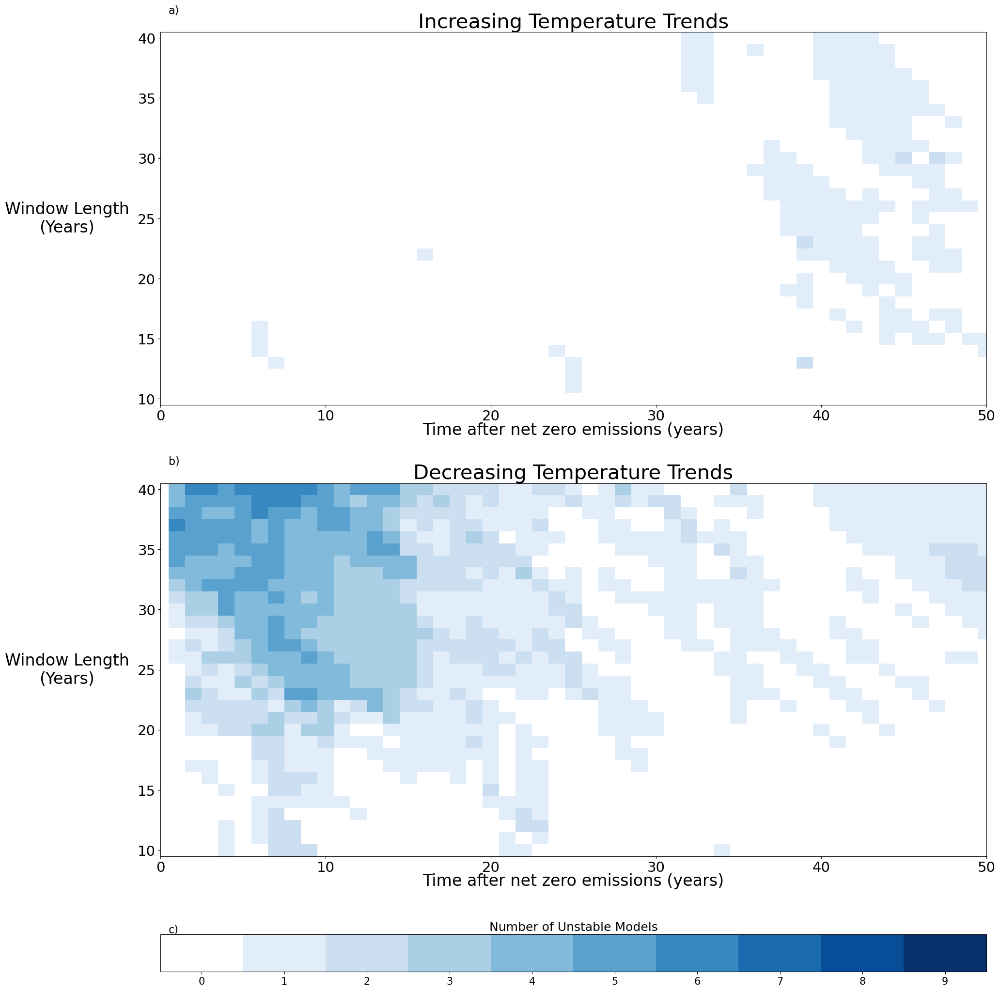

In [65]:
%matplotlib inline
fig = plt.figure(figsize=(sn_plotting.plot_kwargs['width'], sn_plotting.plot_kwargs['height']*2.1))

gs = gridspec.GridSpec(3,1, height_ratios=[1, 1, 0.1], hspace=sn_plotting.plot_kwargs['hspace'])
axes = [fig.add_subplot(gs[i]) for i in range(3)]

sn_plotting.sn_multi_window_in_time(
    rolling_stability_levels_ds.sel(stability='increasing').count(dim='model'), cmap=my_blues,
    fig=fig, gs=gs, ax=axes[0], add_colorbar=False, return_all=False,
    axes_title='Increasing Temperature Trends', bbox_to_anchor=(1, 1.4),
    **stability_colorplot_kwargs_no_temp_line,  **plot_kwargs)

sn_plotting.sn_multi_window_in_time(
    rolling_stability_levels_ds.sel(stability='decreasing').count(dim='model'), cmap=my_blues,
    fig=fig, gs=gs, ax=axes[1], cax=axes[2], return_all=False,
    axes_title='Decreasing Temperature Trends',
    add_legend=False, **stability_colorplot_kwargs_no_temp_line,  **plot_kwargs)

for num, ax_ in enumerate(axes): plotting_functions.add_figure_label(ax_, f'{chr(97+num)})')

In [66]:
%matplotlib inline

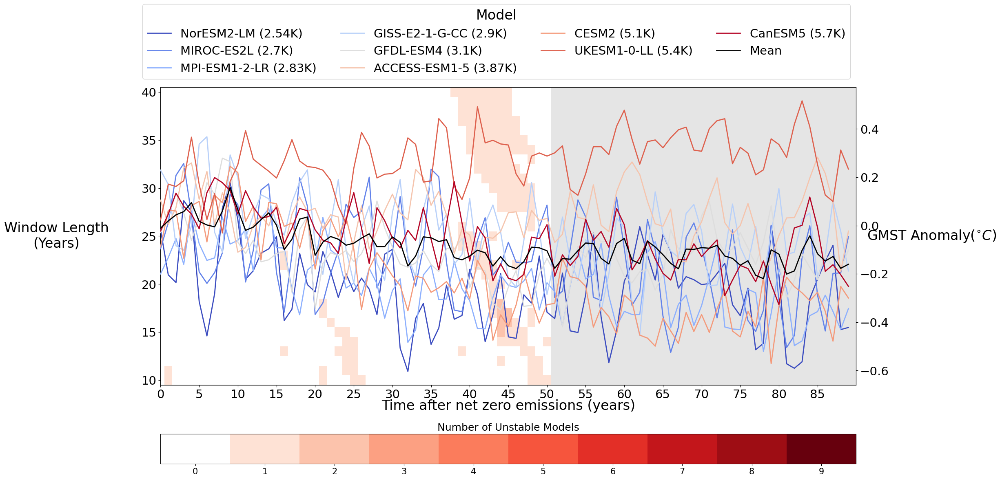

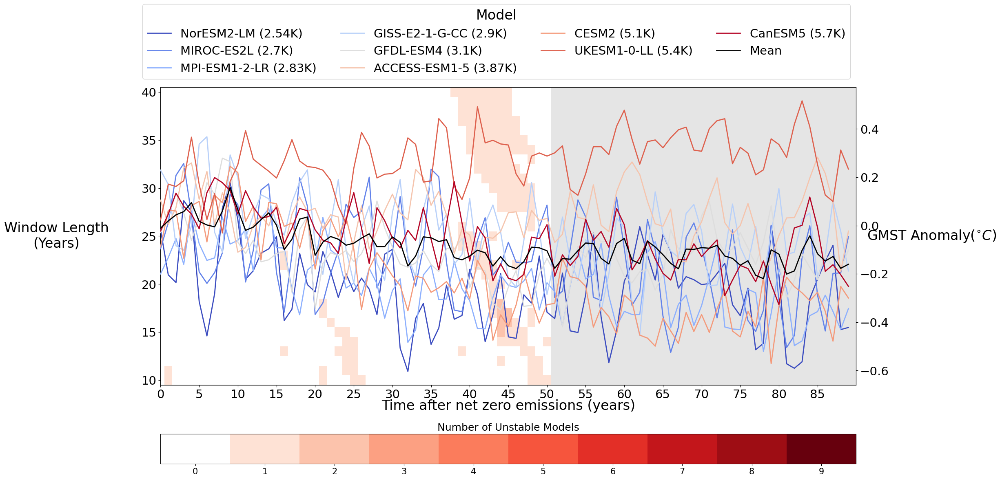

In [67]:
fig, axes = sn_plotting.sn_multi_window_in_time(
    static_stability_levels_ds.sel(stability='increasing').count(dim='model'),
    temp_da=experiment_zec_ds_smean_anom, cmap=my_reds, **stability_colorplot_kwargs,  **plot_kwargs)
fig

In [68]:
reload(sn_plotting)

<module 'sn_plotting' from '/home/563/ab2313/Documents/PhD/modules/sn_plotting.py'>

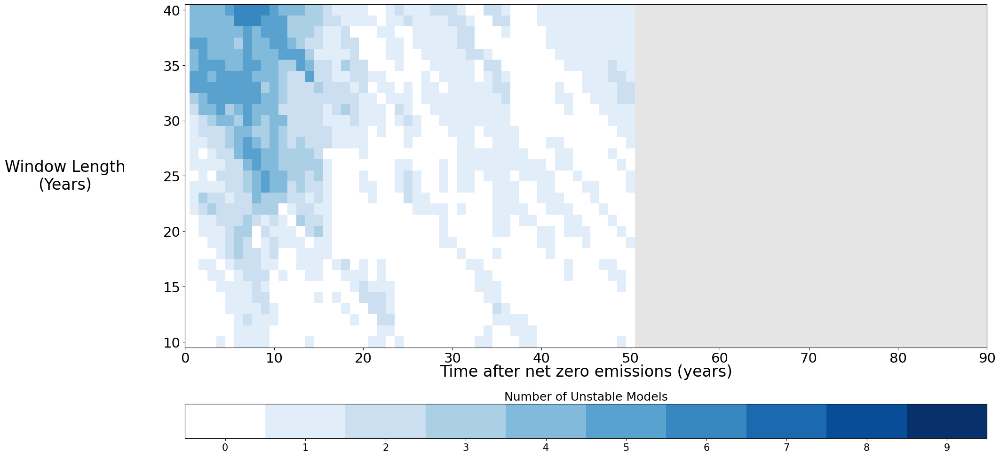

In [69]:
fig, axes = sn_plotting.sn_multi_window_in_time(
    static_stability_levels_ds.sel(stability='decreasing').count(dim='model'),
    cmap=my_blues, **stability_colorplot_kwargs,  **plot_kwargs)

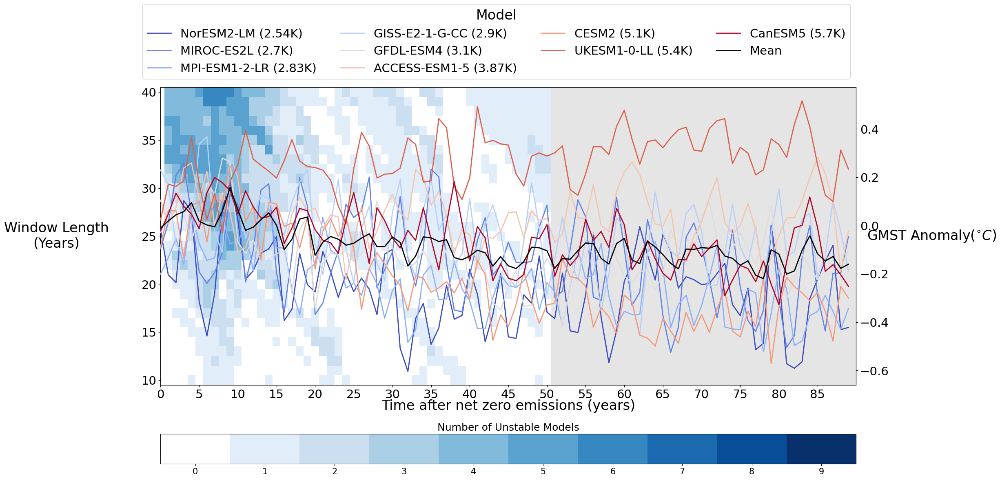

In [70]:
fig, axes = sn_plotting.sn_multi_window_in_time(
    static_stability_levels_ds.sel(stability='decreasing').count(dim='model'),
    temp_da=experiment_zec_ds_smean_anom, cmap=my_blues, **stability_colorplot_kwargs,  **plot_kwargs)

In [71]:
%matplotlib inline

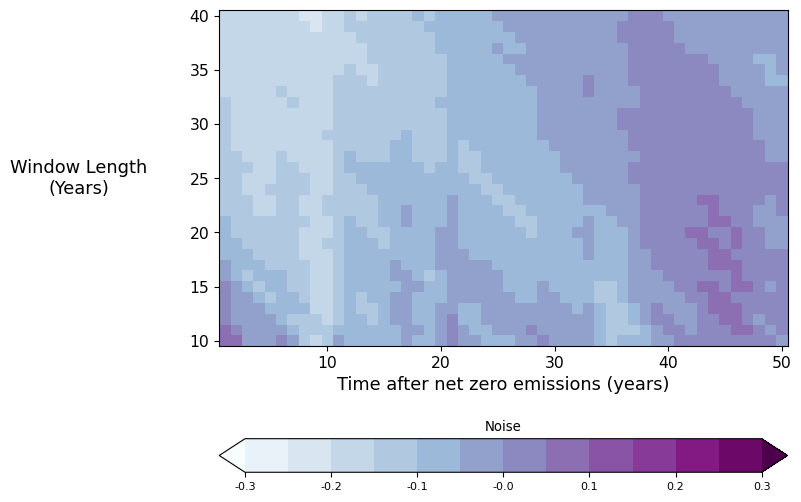

In [72]:
signal_levels = sn_plotting.create_levels(vmax=.3, vmin=-.3, step=.05)

sn_plotting.plot_heatmap(sn_multi_rolling_ds.signal.mean(dim='model'), levels=signal_levels, 
                                figsize=(sn_plotting.plot_kwargs['width']/3,
                                         sn_plotting.plot_kwargs['height']/2), 
                               cmap='BuPu', extend='both', cut_ticks=2, max_color_lim=50, 
                               font_scale=0.8, cbar_label='Noise', hspace=0.2, return_all=False)

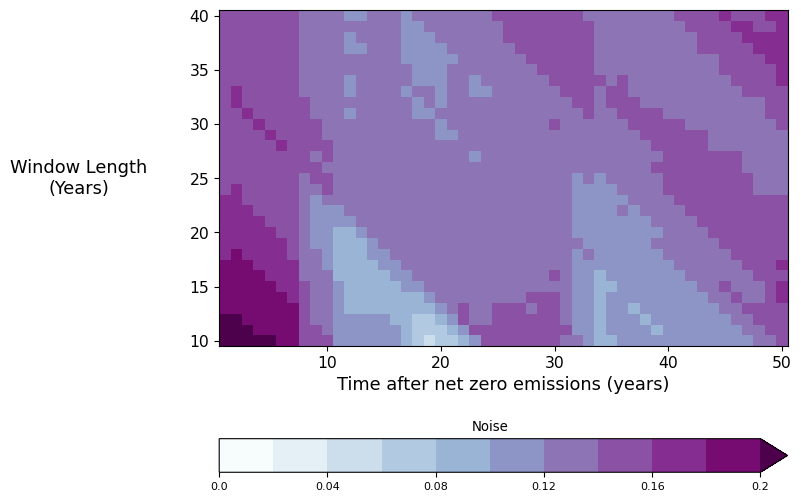

In [73]:
noise_levels = sn_plotting.create_levels(vmax=.2, vmin=0, step=.02)
sn_plotting.plot_heatmap(sn_multi_rolling_ds.noise.isel(model=7), levels=noise_levels, 
                                figsize=(sn_plotting.plot_kwargs['width']/3,
                                         sn_plotting.plot_kwargs['height']/2), 
                               cmap='BuPu', extend='max', cut_ticks=2, max_color_lim=50, 
                               font_scale=0.8, cbar_label='Noise', hspace=0.2, return_all=False)

/g/data/w40/ab2313/images/PhD/top_level/01_global_average_noise_rolling.png


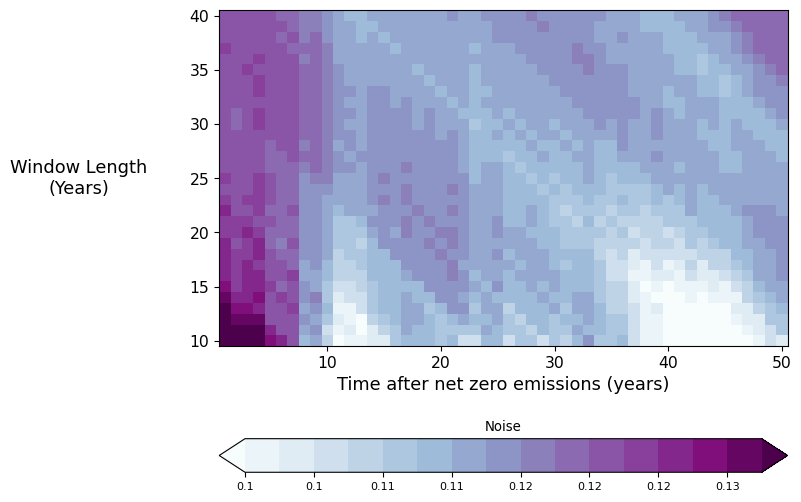

In [74]:
noise_levels = sn_plotting.create_levels(vmax=.13, vmin=0.1, step=.002)
sn_plotting.plot_heatmap(sn_multi_rolling_ds.noise.mean(dim='model'), levels=noise_levels, 
                                figsize=(sn_plotting.plot_kwargs['width']/3,
                                         sn_plotting.plot_kwargs['height']/2), 
                               cmap='BuPu', extend='both', cut_ticks=2, max_color_lim=50, 
                               font_scale=0.8, cbar_label='Noise', hspace=0.2, return_all=False)

save_name = os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL,
                         f'{notebook_number}_global_average_noise_rolling.png')
print(save_name)
fig.savefig(save_name, dpi=300, bbox_inches='tight')

In [75]:
percent_frac = sn_multi_rolling_ds.noise*100/sn_multi_static_ds.noise
diff = sn_multi_rolling_ds.noise - sn_multi_static_ds.noise
percent_diff = diff * 100/sn_multi_rolling_ds.noise

In [76]:
# plot_kwargs_2 = dict(height=12, width=22, hspace=0.3, #vmin=-8, vmax=8, step=2, 
#                    cmap = 'RdBu_r', line_color = 'limegreen', line_alpha=0.65, 
#                    ax2_ylabel = 'Anomaly', cbar_label = 'Signal-to-Noise', cbartick_offset=0,
#                    axes_title='',
#                    title='', label_size=12, extend='both', xlowerlim=None, xupperlim=None,  filter_max=True,)